An example notebook to make a plot showing DEM results over a period of time longer than a single orbit.

The idea is that you have already run DEMs for time intervals in each orbit (or other longer interval). 

Here, we will provide a few options for loading in all the time intervals, and then making a summary plot. 

Certain DEM inputs will need to be the same across each of your longer intervals:
- energy range used for time interval selection (TIS)
- type of counts (grade, pile-up corr) used for TIS
- min counts/interval used for TIS



In [3]:
#AIA Error table - set path to location in your system.
errortab='/Users/jessieduncan/ssw/sdo/aia/response/aia_V3_error_table.txt'

#Sunpy data directory (or wherever else you store your downloaded AIA data)
sunpy_dir='/Users/jessieduncan/sunpy/data/'

#Path to top-level do-dem directory - edit for your system.
path_to_dodem = '/Users/jessieduncan/do-dem/'
from sys import path as sys_path
sys_path.append(path_to_dodem+'/dodem/')

#do-dem
#import lightcurves as lc
#import region_fitting as rf
#import nustar_dem_prep as nu
#import dodem
import time_interval_selection as tis
import visualize_dem_results as viz

#Basics
import numpy as np
import importlib
import matplotlib.pyplot as plt
from astropy import units as u

#Time
import matplotlib.dates as mdates
import astropy.time
import datetime

#File wrangling
import glob
import pickle
import os
import pathlib
os.getcwd()

'/Users/jessieduncan/do-dem'

First, let's find the time interval files:

In [ ]:
all_time_intervals=[]

#Option one: user-input of the actual names of the files:
all_time_intervals=[]
time_interval_files = ['15-59-30_16-02-00_corr54_min10time_intervals.pickle', 
                       '16-17-30_16-25-00_corr54_min10time_intervals.pickle']

for tf in time_interval_files:
    print('')
    time_intervals = tis.get_saved_intervals('', lctype='corr54', erange=[6.,10],       
                                         countmin=10, custom_file=tf)
    #Print resulting intervals
    count=0    
    for t in time_intervals:
        print(count, t[0].strftime('%H-%M-%S'), t[1].strftime('%H-%M-%S'))
        count+=1
    
    all_time_intervals.append(time_intervals)

In [ ]:
#Option two: user-input of the time ranges and other parameters used to make the time interval files,
#and then we will load a list of files. 
lctype='corr54'
erange=[6.,10.]
countmin=10
timeranges=[[datetime.datetime(2018, 5, 29, 22, 22), datetime.datetime(2018, 5, 29, 23, 20)],
            [datetime.datetime(2018, 5, 29, 22, 22), datetime.datetime(2018, 5, 29, 23, 20)]]

all_time_intervals=[]
for tr in timeranges:
    print('')
    time_intervals = tis.get_saved_intervals(timerange, lctype=lctype, erange=erange,       
                                         countmin=countmin, custom_file=[])
    #Print resulting intervals
    count=0    
    for t in time_intervals:
        print(count, t[0].strftime('%H-%M-%S'), t[1].strftime('%H-%M-%S'))
        count+=1
        
    all_time_intervals.append(time_intervals)

In [ ]:
importlib.reload(viz)

#Working directory - location of time interval summary files
working_dir='./initial_dem/'
#What temperature range would you like to use? (units: log(T))
minT=5.6
maxT=7.2
name='initial_dem'

#list of dictionaries of DEM output values
all_vals=[]
#list of start of all time intervals for each orbit (datetime format)
all_time_lists_nostep=[]
#list of start of all time intervals + end of last one for each orbit (datetime format)
all_time_lists = []
#list of middle of all time intervals for each orbit (datetime format)
all_midtimes = []
#all start times (big list)
alltimes = []

#start, end for each orbit
orbitstarts_ = []
orbitstops_ =[]



for ti in all_time_intervals:
    
    vals = viz.get_DEM_timeseries(time_intervals, working_dir, minT, maxT, name)  
    all_vals.append(vals)
    
    #different types of time list:
    #datetimes (start time of each interval)
    times = [t[0].datetime for t in time_intervals]
    all_time_lists_nostep.append(times)
    alltimes.extend(times)
    #datetimes (same but with the end of the last interval added for plt.stairs use)
    times_ = copy.deepcopy(times)
    times_.append(time_intervals[-1][1].datetime)
    all_time_lists.append(times_)
    #middle of each time interval
    midtimes=[(t[0]+(t[1]-t[0]).to(u.s)/2).datetime for t in time_intervals] 
    all_midtimes.append(midtimes)
    
    orbitstarts_.append(time_intervals[0][0])
    orbitstops_.append(time_intervals[-1][1])
    
orbitstarts = [o.datetime for o in orbitstarts_] 
orbitstops = [o.datetime for o in orbitstops_] 

In [ ]:
#MAKE BIG FIGURE

import matplotlib.dates as mdates

lw=2.5
tickfont=12

fig, axes = plt.subplots(6, 1, figsize=(18,18), tight_layout = {'pad': 1}, sharex=True) 
fig.subplots_adjust(hspace=0.07)

valstrings = ['peaks','above10s','above7s','above5s', 'low_powers', 'hi_powers']
backcolors = [['pink', 'lavenderblush'], ['powderblue', 'aliceblue'], ['powderblue', 'aliceblue'],
             ['powderblue', 'aliceblue'], ['khaki', 'lemonchiffon'],['khaki', 'lemonchiffon']]
colors = ['Red', 'Blue', 'Green', 'Purple', 'Orange', 'Red']
factor = [1,1,1,1,1,-1]
theylabels=['T (MK)','EM (cm^-5)', 'EM (cm^-5)','EM (cm^-5)','Index', 'Index']
thetitles=['DEM Peak Temperature', 'Total EM >10 MK', 'Total EM >7 MK', 'Total EM >5 MK',
          'Lower Power Law', 'Upper Power Law']

num=0
while num < 6:
    ax=axes[num]
    
    for t in range(0, len(timeranges)+1):
        ax.axvspan(orbitstarts[t], orbitstops[t], alpha=.5, color=backcolors[num][0])
        if t > 0:
            ax.axvspan(orbitstops[t-1], orbitstarts[t], alpha=.5, color=backcolors[num][1])
    
    for t in range(0,len(timeranges)):
        plotvals = all_vals[t][valstrings[num]]
        ax.stairs(np.array(plotvals), all_time_lists[t], linewidth=lw, color=colors[num], baseline=None)
        
    ax.set_yscale('log')
    ax.set_title(thetitles[num], fontsize=20)
    ax.set_ylabel(theylabels[num], fontsize=15, color=colors[num])
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.xaxis.set_minor_locator(mdates.MinuteLocator(interval=10))
    ax.set_xlim([(orbitstarts_[0]-120*u.s).datetime, (orbitstops_[-1]+120*u.s).datetime])
    ax.tick_params(axis='x', labelsize=tickfont)
    ax.tick_params(axis='y', labelsize=tickfont)
    ax.grid(True,which='minor', axis='x', lw=0.5,color='black', linestyle='dotted')



In [ ]:
importlib.reload(viz)
vals = viz.get_DEM_timeseries(time_intervals, working_dir, minT, maxT, name)    


peaks=vals['peaks']
peaksmk = [10**m1/1e6 for m1 in peaks]    

backcolors=['pink', 'lavenderblush']
color='Red'
    
viz.pretty_orbit_timeseries(time_intervals, peaksmk, 'DEM Peak Temperature (MK)', 'DEM Peak Temperature',
                        color, backcolors)


backcolors=['powderblue', 'aliceblue']
color='Blue'

above10s=np.array(vals['above10s'])
above10s_=above10s[:,0]

viz.pretty_orbit_timeseries(time_intervals, above10s_, 'EM (cm^-5)', 'Total EM >10 MK',
                        color, backcolors, error=True, quantity_low=above10s[:,1], quantity_high=above10s[:,2], 
                        ylog=True, comparisonbar=True, comp_band=[1.8e22, 1.5e23, 'Ishikawa (2017) 95%'])

backcolors=['powderblue', 'aliceblue']
color='Green'

above7s=np.array(vals['above7s'])
above7s_=above7s[:,0]

viz.pretty_orbit_timeseries(time_intervals, above7s_, 'EM (cm^-5)', 'Total EM >7 MK',
                        color, backcolors, error=True, quantity_low=above7s[:,1], quantity_high=above7s[:,2], 
                        ylog=True)

backcolors=['powderblue', 'aliceblue']
color='Purple'

above5s=np.array(vals['above5s'])
above5s_=above5s[:,0]

viz.pretty_orbit_timeseries(time_intervals, above5s_, 'EM (cm^-5)', 'Total EM >5 MK',
                        color, backcolors, error=True, quantity_low=above5s[:,1], quantity_high=above5s[:,2], 
                        ylog=True)


backcolors=['khaki', 'lemonchiffon']
color='Orange'

val=np.array(vals['low_powers'])

viz.pretty_orbit_timeseries(time_intervals, val, 'Index', 'Lower Power Law',
                        color, backcolors, error=False)


backcolors=['khaki', 'lemonchiffon']
color='Red'

val=np.array(vals['hi_powers'])*-1

viz.pretty_orbit_timeseries(time_intervals, val, 'Index', 'Upper Power Law',
                        color, backcolors, error=False)




In [7]:
importlib.reload(viz)

#Name your working directory
working_dir='./initial_dem/'
#What temperature range would you like to use? (units: log(T))
minT=5.6
maxT=7.2
name='initial_dem'



time_interval_files = ['15-59-30_16-02-00_corr54_min10time_intervals.pickle', '16-17-30_16-25-00_corr54_6.0-10keV_min10time_intervals.pickle']

for tf in time_interval_files:
    print('')
    time_intervals = tis.get_saved_intervals('', lctype='corr54', erange=[6.,10],       
                                         countmin=10, custom_file=tf)

    #Print resulting intervals
    count=0    
    for t in time_intervals:
        print(count, t[0].strftime('%H-%M-%S'), t[1].strftime('%H-%M-%S'))
        count+=1
        
        
    importlib.reload(viz)
    vals = viz.get_DEM_timeseries(time_intervals, working_dir, minT, maxT, name)    




0 15-59-30 16-00-40
1 16-00-40 16-01-10
2 16-01-10 16-02-00


FileNotFoundError: [Errno 2] No such file or directory: './initial_dem/15-59-30_16-00-40/15-59-30_16-00-40_5.6_7.2_initial_dem_MC_DEM_result.pickle'

In [ ]:
importlib.reload(viz)

In [2]:
#Name your working directory
working_dir='./initial_dem/'

#Make a new working directory for prepped data/etc if it doesn't yet exist
save_path = pathlib.Path(working_dir)
if not save_path.exists():
    save_path.mkdir()

#Set path to obsid directory - initial pipeline should have been run already.
datapath='/Users/jessieduncan/nustar/may-2018/5_29pixpos/80410205001/'
obsid='80410205001'
gtifile=datapath+'event_cl/nu'+obsid+'A06_gti.fits'

#Comment second line if you're not using this same example nustar orbit
#Edit it to include only the desired time interval (default- all times in file) once you've run this once
timerange=[]
timerange=[datetime.datetime(2018, 5, 29, 22, 22), datetime.datetime(2018, 5, 29, 23, 20)]

time_intervals = tis.get_saved_intervals(timerange, lctype='corr54', erange=[6.,10],       
                                         countmin=10, custom_file=[])

#Print resulting intervals
count=0    
for t in time_intervals:
    print(count, t[0].strftime('%H-%M-%S'), t[1].strftime('%H-%M-%S'))
    count+=1

0 22-22-00 22-25-50
1 22-25-50 22-27-25
2 22-27-25 22-29-00
3 22-29-00 22-30-00
4 22-30-00 22-31-40
5 22-31-40 22-33-00
6 22-33-00 22-35-40
7 22-35-40 22-39-45
8 22-39-45 22-43-15
9 22-43-15 22-46-05
10 22-46-05 22-48-55
11 22-48-55 22-50-50
12 22-50-50 22-51-55
13 22-51-55 22-53-10
14 22-53-10 22-53-55
15 22-53-55 22-58-00
16 22-58-00 23-00-00
17 23-00-00 23-02-15
18 23-02-15 23-04-40
19 23-04-40 23-07-40
20 23-07-40 23-08-10
21 23-08-10 23-09-05
22 23-09-05 23-09-50
23 23-09-50 23-10-25
24 23-10-25 23-11-40
25 23-11-40 23-13-45
26 23-13-45 23-15-25
27 23-15-25 23-20-00


Setting DEM basics:

In [3]:
#What instruments are you using?
#---------------------------------
aia=True
#---------------------------------
eis=False
#---------------------------------
xrt=False
xrt_path=working_dir+'/XRT_for_DEM/'

plot=False
#Here is the exposure time limits dictionary for each XRT filter combination:
exposure_dict={'Be_thin': [1*u.s, 10*u.s],
                'Be_med': [],
              'Al_poly': [0.1*u.s, 1*u.s]}
#---------------------------------
nustar=True
#If nustar is being used, here are the chosen energy ranges:
nuenergies=[[2.5,3.5],[3.5,6.], [6.,10.]]
#---------------------------------

#---------------------------------
#---------------------------------
#What temperature range would you like to use? (units: log(T))
minT=5.6
maxT=7.2

#Would you prefer to plot temperatures in MK, or the default (logT)
plotMK=False
#---------------------------------
#---------------------------------

name='initial_dem'

By following the process in time_interval_selection, you have already made NuSTAR spectral data products for each of these intervals (at least for FPMA). We have output region files for each time interval, which were used to make the NuSTAR data products via one of two methods:
- circle with input radius, center at the COM of the NuSTAR emission
OR
- circle with input radius, location optimized to contain the maximal amount of NuSTAR emission.

In either case, given NuSTAR's pointing uncertainty, these regions may not be optimal for AIA and XRT.

Here, we will run the DEM code with the just_prep flag set, and the plot commands set true for AIA (and XRT if set True in the cell above). You can then check how well the NuSTAR region works for the other instruments, and define a shift to the location of the circle if needed. 

If desired, you can check this with a few time intervals to make sure the shift is appropriate over the whole time interval (edit the first line). 

[-48.74534934 248.63038725] arcsec
150.0 arcsec
400.0 arcsec 400.0 arcsec
Start Time:  2018-05-29 22:22:00
Stop Time:  2018-05-29 22:25:50
You provided both a region box and a specific region.
Bounding box will be used only for initial data prep (will save submap instead of full disk);
specific region will be used for DEM

Adding 10% error in quadrature with aiapy.estimate_error output.

ARF File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_0_p_sr.arf']
RMF File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_0_p_sr.rmf']
PHA File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_0_p_sr.pha']
Using grades 0-4 NuSTAR events.
ARF File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_0_4_p_sr.arf']
RMF File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_0_4_p_sr.rmf']
PHA File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_0_4_p_sr.pha']
ARF File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_21_24_p_sr.arf']
RMF File:  ['./initial_dem/22-22-00_22-25-

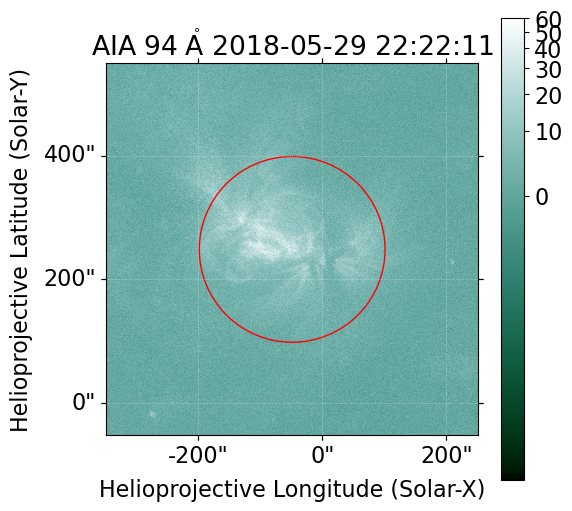

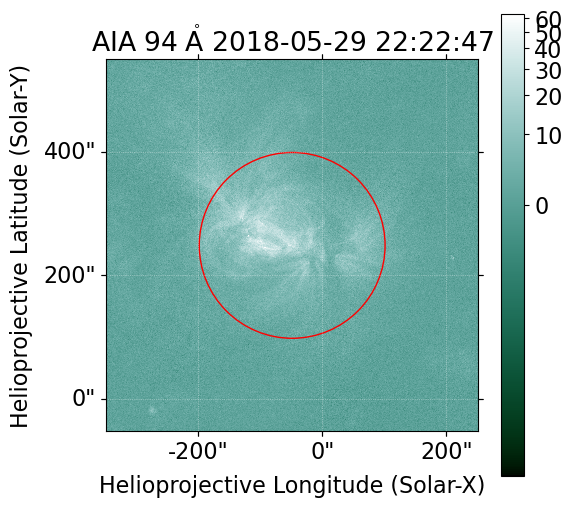

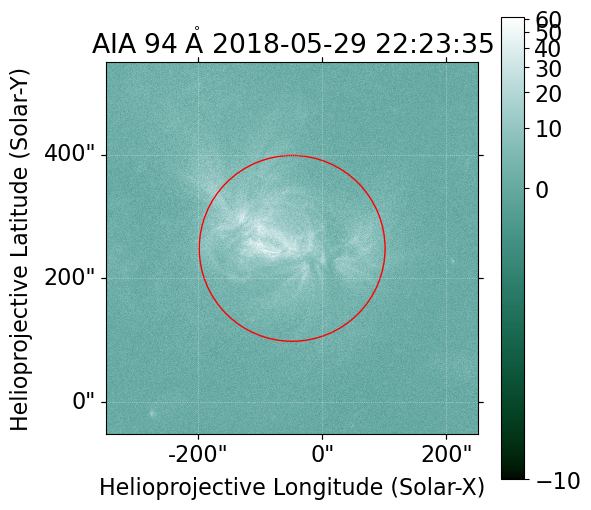

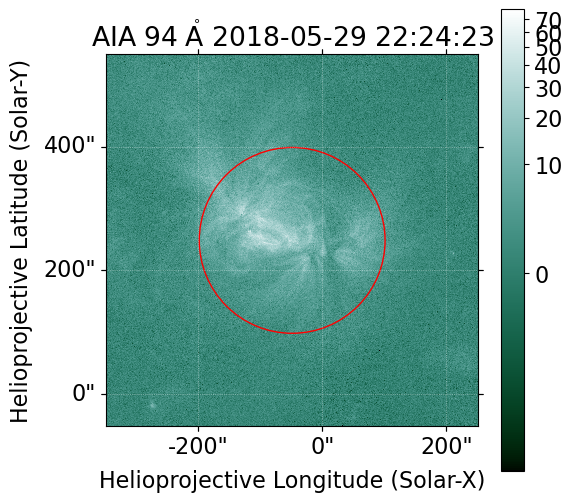

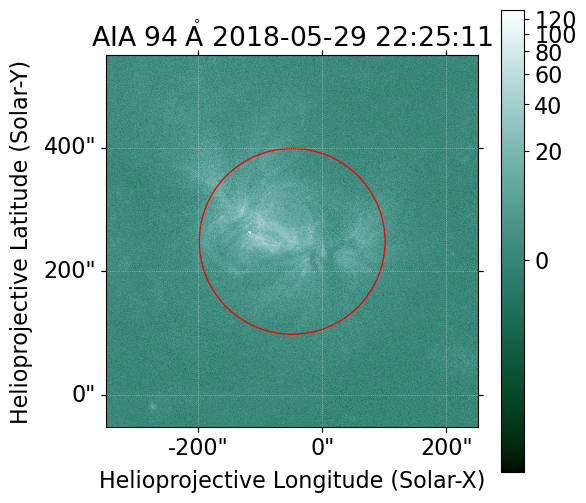

...

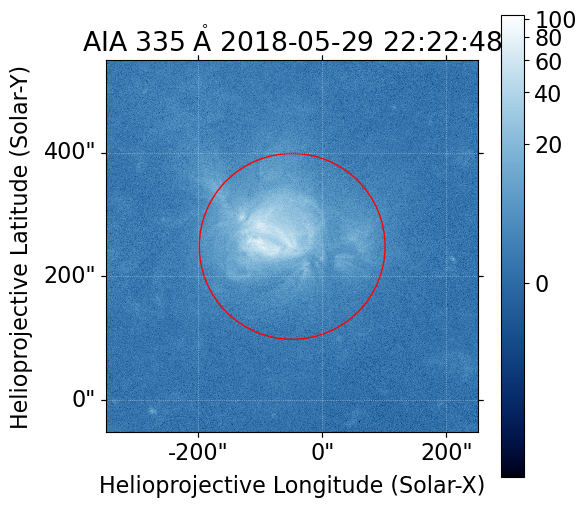

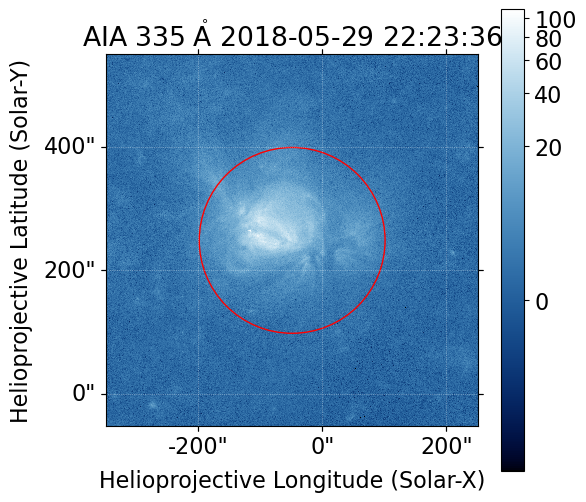

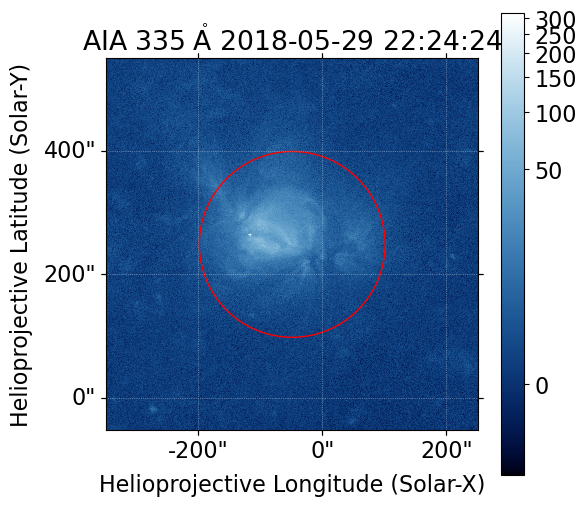

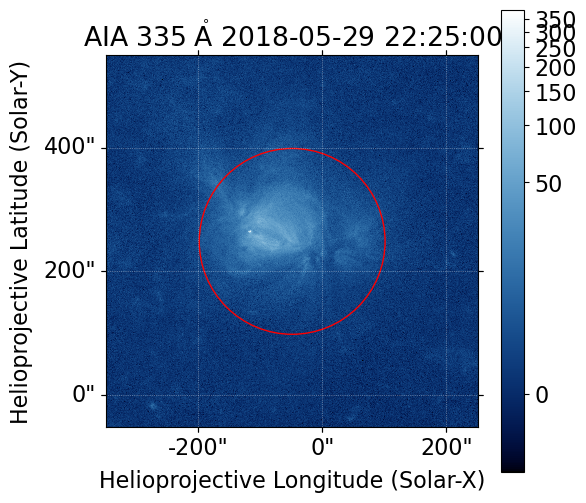

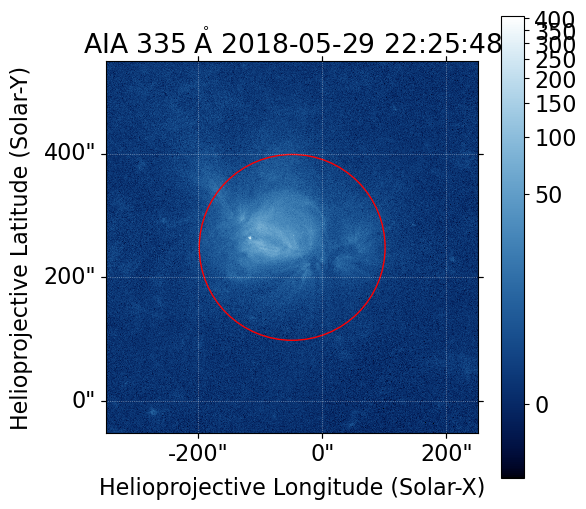

In [4]:
time_interval = time_intervals[0]
timestring = time_interval[0].strftime('%H-%M-%S')
stopstring = time_interval[1].strftime('%H-%M-%S')
timestring=timestring+'_'+stopstring
    
regfile=working_dir+timestring+'/nu'+obsid+'A06_0_4_p_cl_sunpos_COM_region.reg'
offset, rad = rf.read_regfile(regfile, time_interval[0], time_interval[1], 'hourangle')
print(offset)
print(rad)

xx = offset[0].value
yy = offset[1].value

#Set broad box for plotting (using region object)
bl=[(xx-200)*u.arcsec, (yy-200)*u.arcsec]
tr=[(xx+200)*u.arcsec,(yy+200)*u.arcsec]
print(tr[0]-bl[0], tr[1]-bl[1])

#Make region dictionary 
region_input = {'center': (xx,  yy)*u.arcsec,
                  'radius': rad}



#Run DEM code (just_prep set, stop before actual DEM)
res = dodem.dodem(time_interval, bl, tr, xrt=xrt, aia=aia, nustar=nustar, name=name,
                                    plotMK=plotMK, minT=minT, maxT=maxT,
                                    plotresp=False, working_directory=working_dir,
                                    default_err=0.2, path_to_dodem=path_to_dodem,
                                    just_prep=True,
                                    
                                    #nustar related 
                                    combine_fpm=True, nuenergies=nuenergies, make_nustar=True, 
                                    datapath=datapath, gtifile=gtifile,
                                    COM_nustar_region=True, nuclobber=False, edit_regfile=True,
                                    adjacent_grades=True, pile_up_corr=True,
            
                                    #aia related
                                    aiamethod='Auto', real_aia_err=True,
                                    input_aia_region="circle", input_aia_region_dict=region_input,
                                       sunpy_dir=sunpy_dir, errortab=errortab,
                                       plot_aia=aia,
                                   
                                    #xrt-related
                                    xrtmethod='Average', real_xrt_err=True, xrt_path=xrt_path,
                                    xrt_exposure_dict=exposure_dict,
                                    input_xrt_region="circle", input_xrt_region_dict=region_input,
                                       plot_xrt=xrt)


[-93.74534934 273.63038725] arcsec
Start Time:  2018-05-29 22:22:00
Stop Time:  2018-05-29 22:25:50
You provided both a region box and a specific region.
Bounding box will be used only for initial data prep (will save submap instead of full disk);
specific region will be used for DEM

Adding 10% error in quadrature with aiapy.estimate_error output.

ARF File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_0_p_sr.arf']
RMF File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_0_p_sr.rmf']
PHA File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_0_p_sr.pha']
Using grades 0-4 NuSTAR events.
ARF File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_0_4_p_sr.arf']
RMF File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_0_4_p_sr.rmf']
PHA File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_0_4_p_sr.pha']
ARF File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_21_24_p_sr.arf']
RMF File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_21_24_p_sr.rmf']
PH

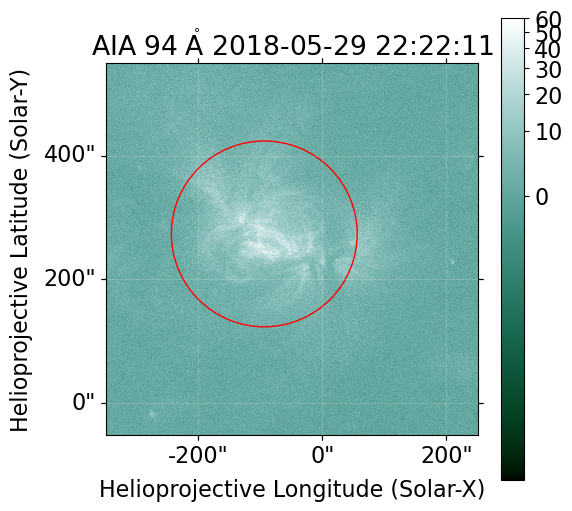

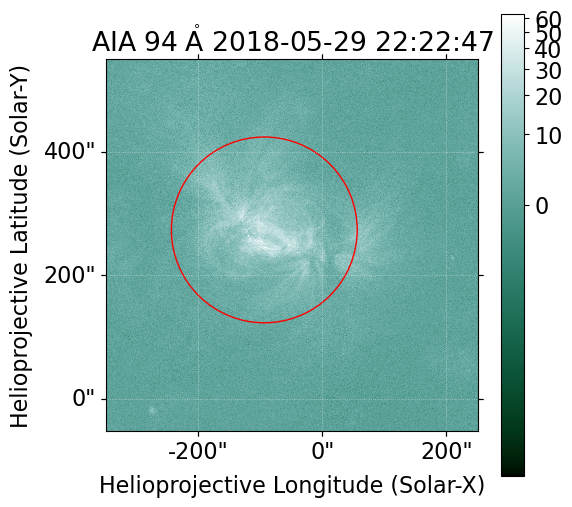

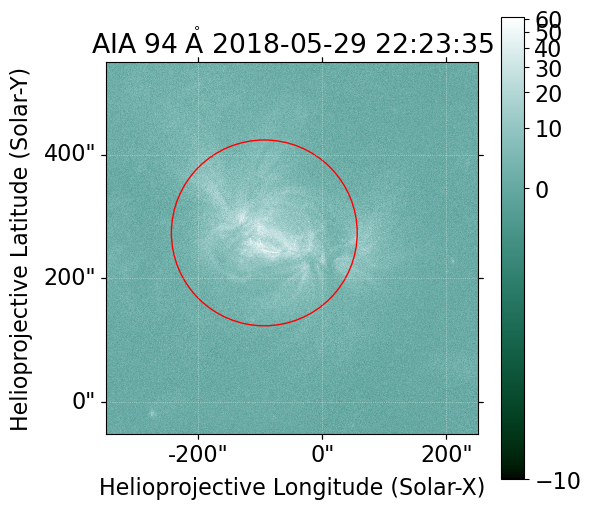

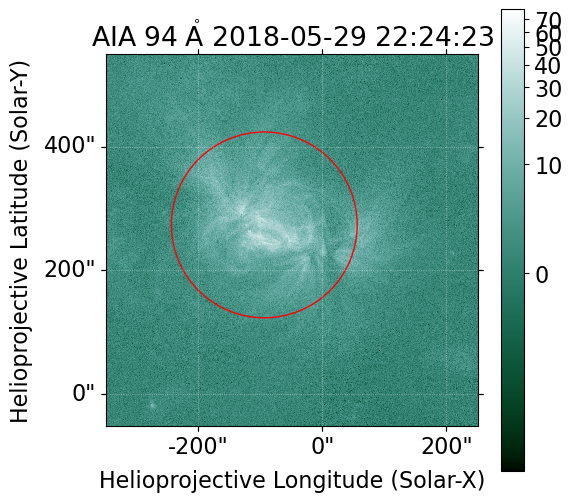

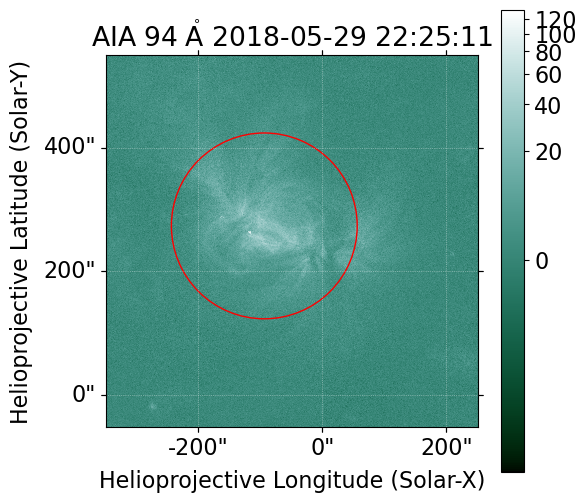

...

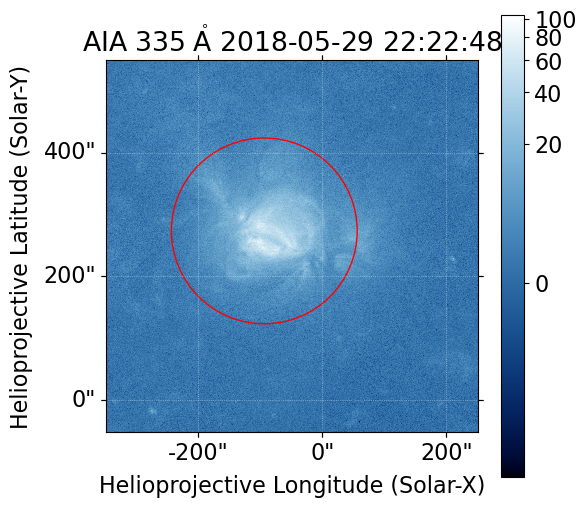

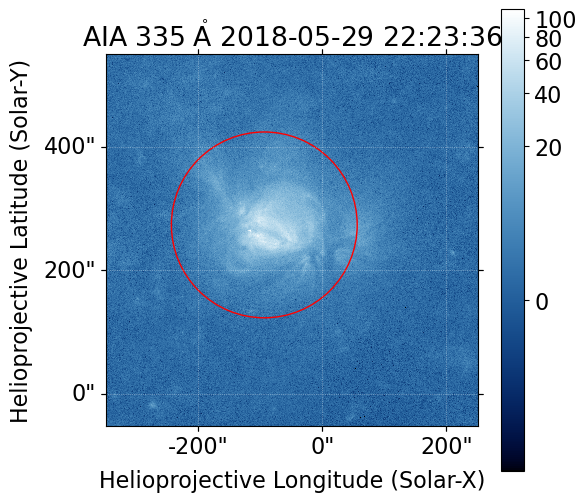

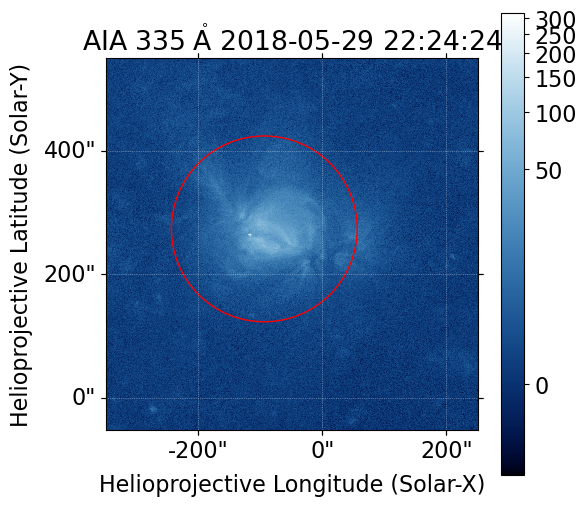

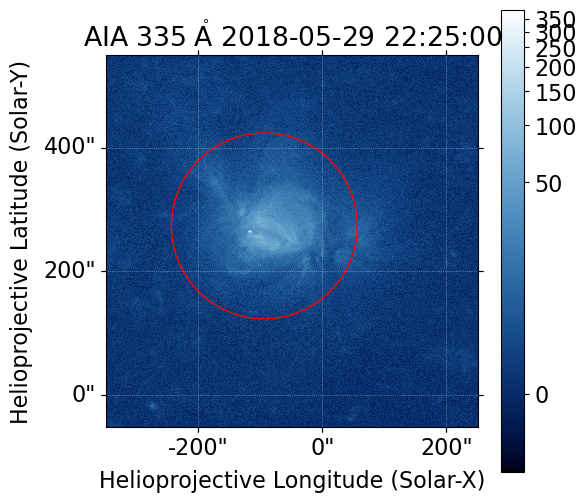

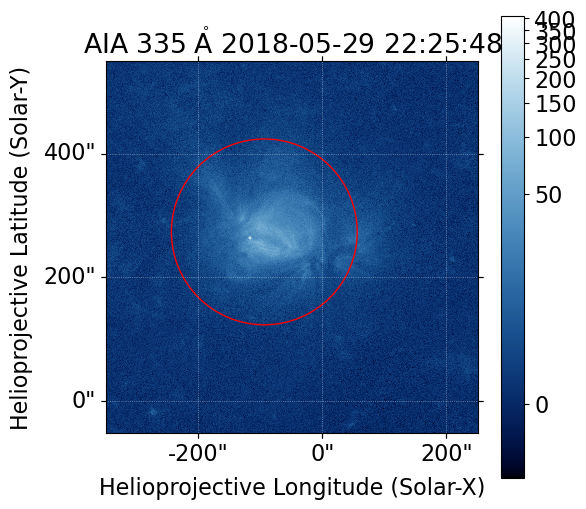

In [5]:
#Add shift to region and run again to check result:
region_input = {'center': (xx-45,  yy+25)*u.arcsec,
                  'radius': rad}
print(region_input['center'])
#Run DEM code (just_prep set, stop before actual DEM)
res = dodem.dodem(time_interval, bl, tr, xrt=xrt, aia=aia, nustar=nustar, name=name,
                                    plotMK=plotMK, minT=minT, maxT=maxT,
                                    plotresp=False, working_directory=working_dir,
                                    default_err=0.2, path_to_dodem=path_to_dodem,
                                    just_prep=True,
                                    
                                    #nustar related 
                                    combine_fpm=True, nuenergies=nuenergies, make_nustar=True, 
                                    datapath=datapath, gtifile=gtifile,
                                    COM_nustar_region=True, nuclobber=False, edit_regfile=True,
                                    adjacent_grades=True, pile_up_corr=True,
            
                                    #aia related
                                    aiamethod='Auto', real_aia_err=True,
                                    input_aia_region="circle", input_aia_region_dict=region_input,
                                       sunpy_dir=sunpy_dir, errortab=errortab,
                                       plot_aia=aia,
                                   
                                    #xrt-related
                                    xrtmethod='Average', real_xrt_err=True, xrt_path=xrt_path,
                                    xrt_exposure_dict=exposure_dict,
                                    input_xrt_region="circle", input_xrt_region_dict=region_input,
                                       plot_xrt=xrt)

Now that we have an adjusted region for AIA (and/or XRT), let's run the DEMs for the whole time interval. 
This can be sloooow, for a few reasons:
- If your observation has decent statistics, it's possible you haven't made the FPMB spectral data products for all (or some) intervals yet – as if more than your minimum count target was found in FPMA for a given interval, FPMB isn't checked. Making the NuSTAR spectral data products takes a while.
- If you've never looked at this orbit before (or with these time intervals), you'll need to download AIA data as well as prep it. This is interminable, especially since the JSOC will throttle you for trying to download a lot of data. 

Once you run the DEM once, repeating it to change something about the DEM process is much quicker – it took ~4 hours to run this example the first time, and ~22 minutes thereafter. 

In [12]:
for t in time_intervals:
    dodem.dodem(t, bl, tr, xrt=xrt, aia=aia, nustar=nustar, name=name,
                                    plotMK=plotMK, minT=minT, maxT=maxT,
                                    plotresp=False, working_directory=working_dir,
                                    default_err=0.2, path_to_dodem=path_to_dodem,
                
                                    #demreg related
                                    rgt_fact=1.2, max_iter=30,
                                    reg_tweak=1, gloci=1, mc_in=True, mc_rounds=100,
                                    
                                    #nustar related 
                                    combine_fpm=True, nuenergies=nuenergies, make_nustar=True, 
                                    datapath=datapath, gtifile=gtifile,
                                    COM_nustar_region=True, nuclobber=False, edit_regfile=True,
                                    adjacent_grades=True, pile_up_corr=True,
            
                                    #aia related
                                    aiamethod='Auto', real_aia_err=True,
                                    input_aia_region="circle", input_aia_region_dict=region_input,
                                       sunpy_dir=sunpy_dir, errortab=errortab,
                                       plot_aia=False,
                                   
                                    #xrt-related
                                    xrtmethod='Average', real_xrt_err=True, xrt_path=xrt_path,
                                    xrt_exposure_dict=exposure_dict,
                                    input_xrt_region="circle", input_xrt_region_dict=region_input,
                                       plot_xrt=False)

Start Time:  2018-05-29 22:22:00
Stop Time:  2018-05-29 22:25:50
You provided both a region box and a specific region.
Bounding box will be used only for initial data prep (will save submap instead of full disk);
specific region will be used for DEM

Adding 10% error in quadrature with aiapy.estimate_error output.

ARF File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_0_p_sr.arf']
RMF File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_0_p_sr.rmf']
PHA File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_0_p_sr.pha']
Using grades 0-4 NuSTAR events.
ARF File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_0_4_p_sr.arf']
RMF File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_0_4_p_sr.rmf']
PHA File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_0_4_p_sr.pha']
ARF File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_21_24_p_sr.arf']
RMF File:  ['./initial_dem/22-22-00_22-25-50/nu80410205001A06_21_24_p_sr.rmf']
PHA File:  ['./initial_dem/22-22-00_2


Max NuSTAR Energy:  7.71999979019165
ARF File:  ['./initial_dem/22-29-00_22-30-00/nu80410205001B06_0_p_sr.arf']
RMF File:  ['./initial_dem/22-29-00_22-30-00/nu80410205001B06_0_p_sr.rmf']
PHA File:  ['./initial_dem/22-29-00_22-30-00/nu80410205001B06_0_p_sr.pha']
Using grades 0-4 NuSTAR events.
ARF File:  ['./initial_dem/22-29-00_22-30-00/nu80410205001B06_0_4_p_sr.arf']
RMF File:  ['./initial_dem/22-29-00_22-30-00/nu80410205001B06_0_4_p_sr.rmf']
PHA File:  ['./initial_dem/22-29-00_22-30-00/nu80410205001B06_0_4_p_sr.pha']
ARF File:  ['./initial_dem/22-29-00_22-30-00/nu80410205001B06_21_24_p_sr.arf']
RMF File:  ['./initial_dem/22-29-00_22-30-00/nu80410205001B06_21_24_p_sr.rmf']
PHA File:  ['./initial_dem/22-29-00_22-30-00/nu80410205001B06_21_24_p_sr.pha']

Max NuSTAR Energy:  7.079999923706055

A94 :     2.95   1.51  51 %
A131 :     24.15   4.28  18 %
A171 :     647.02   67.46  10 %
A193 :     755.15   77.90  10 %
A211 :     275.58   29.05  11 %
A335 :     19.96   2.86  14 %
2.5-3.5keV A+


Not saving this iteration!!

Start Time:  2018-05-29 22:35:40
Stop Time:  2018-05-29 22:39:45
You provided both a region box and a specific region.
Bounding box will be used only for initial data prep (will save submap instead of full disk);
specific region will be used for DEM

Adding 10% error in quadrature with aiapy.estimate_error output.

ARF File:  ['./initial_dem/22-35-40_22-39-45/nu80410205001A06_0_p_sr.arf']
RMF File:  ['./initial_dem/22-35-40_22-39-45/nu80410205001A06_0_p_sr.rmf']
PHA File:  ['./initial_dem/22-35-40_22-39-45/nu80410205001A06_0_p_sr.pha']
Using grades 0-4 NuSTAR events.
ARF File:  ['./initial_dem/22-35-40_22-39-45/nu80410205001A06_0_4_p_sr.arf']
RMF File:  ['./initial_dem/22-35-40_22-39-45/nu80410205001A06_0_4_p_sr.rmf']
PHA File:  ['./initial_dem/22-35-40_22-39-45/nu80410205001A06_0_4_p_sr.pha']
ARF File:  ['./initial_dem/22-35-40_22-39-45/nu80410205001A06_21_24_p_sr.arf']
RMF File:  ['./initial_dem/22-35-40_22-39-45/nu80410205001A06_21_24_p_sr.rmf']
PHA Fil


Max NuSTAR Energy:  7.599999904632568
ARF File:  ['./initial_dem/22-46-05_22-48-55/nu80410205001B06_0_p_sr.arf']
RMF File:  ['./initial_dem/22-46-05_22-48-55/nu80410205001B06_0_p_sr.rmf']
PHA File:  ['./initial_dem/22-46-05_22-48-55/nu80410205001B06_0_p_sr.pha']
Using grades 0-4 NuSTAR events.
ARF File:  ['./initial_dem/22-46-05_22-48-55/nu80410205001B06_0_4_p_sr.arf']
RMF File:  ['./initial_dem/22-46-05_22-48-55/nu80410205001B06_0_4_p_sr.rmf']
PHA File:  ['./initial_dem/22-46-05_22-48-55/nu80410205001B06_0_4_p_sr.pha']
ARF File:  ['./initial_dem/22-46-05_22-48-55/nu80410205001B06_21_24_p_sr.arf']
RMF File:  ['./initial_dem/22-46-05_22-48-55/nu80410205001B06_21_24_p_sr.rmf']
PHA File:  ['./initial_dem/22-46-05_22-48-55/nu80410205001B06_21_24_p_sr.pha']

Max NuSTAR Energy:  9.600000381469727

['2.5-3.5keV', '3.5-6.0keV']
Removed rate in  [6.0, 10.0] B  for being negative after pile-up correction.

A94 :     2.93   1.50  51 %
A131 :     24.37   4.30  18 %
A171 :     653.11   68.07  10 %


Max NuSTAR Energy:  6.759999752044678

A94 :     2.91   1.49  51 %
A131 :     24.25   4.29  18 %
A171 :     651.42   67.90  10 %
A193 :     743.69   76.75  10 %
A211 :     273.27   28.82  11 %
A335 :     19.69   2.84  14 %
2.5-3.5keV A+B :     6191.08   1240.52  20 %
3.5-6.0keV A+B :     685.42   139.37  20 %
6.0-10.0keV A+B :     8.36   3.22  39 %

Doing 100 iterations of DEMReg with input varied within uncertainty!

Not saving this iteration!!


Not saving this iteration!!


Not saving this iteration!!


Not saving this iteration!!

Start Time:  2018-05-29 22:53:10
Stop Time:  2018-05-29 22:53:55
You provided both a region box and a specific region.
Bounding box will be used only for initial data prep (will save submap instead of full disk);
specific region will be used for DEM

Adding 10% error in quadrature with aiapy.estimate_error output.

ARF File:  ['./initial_dem/22-53-10_22-53-55/nu80410205001A06_0_p_sr.arf']
RMF File:  ['./initial_dem/22-53-10_22-53-55/nu80410205001A06_0_p_


Not saving this iteration!!


Not saving this iteration!!


Not saving this iteration!!

Start Time:  2018-05-29 23:00:00
Stop Time:  2018-05-29 23:02:15
You provided both a region box and a specific region.
Bounding box will be used only for initial data prep (will save submap instead of full disk);
specific region will be used for DEM

Adding 10% error in quadrature with aiapy.estimate_error output.

ARF File:  ['./initial_dem/23-00-00_23-02-15/nu80410205001A06_0_p_sr.arf']
RMF File:  ['./initial_dem/23-00-00_23-02-15/nu80410205001A06_0_p_sr.rmf']
PHA File:  ['./initial_dem/23-00-00_23-02-15/nu80410205001A06_0_p_sr.pha']
Using grades 0-4 NuSTAR events.
ARF File:  ['./initial_dem/23-00-00_23-02-15/nu80410205001A06_0_4_p_sr.arf']
RMF File:  ['./initial_dem/23-00-00_23-02-15/nu80410205001A06_0_4_p_sr.rmf']
PHA File:  ['./initial_dem/23-00-00_23-02-15/nu80410205001A06_0_4_p_sr.pha']
ARF File:  ['./initial_dem/23-00-00_23-02-15/nu80410205001A06_21_24_p_sr.arf']
RMF File:  ['./initial_dem

Adding 10% error in quadrature with aiapy.estimate_error output.

ARF File:  ['./initial_dem/23-07-40_23-08-10/nu80410205001A06_0_p_sr.arf']
RMF File:  ['./initial_dem/23-07-40_23-08-10/nu80410205001A06_0_p_sr.rmf']
PHA File:  ['./initial_dem/23-07-40_23-08-10/nu80410205001A06_0_p_sr.pha']
Using grades 0-4 NuSTAR events.
ARF File:  ['./initial_dem/23-07-40_23-08-10/nu80410205001A06_0_4_p_sr.arf']
RMF File:  ['./initial_dem/23-07-40_23-08-10/nu80410205001A06_0_4_p_sr.rmf']
PHA File:  ['./initial_dem/23-07-40_23-08-10/nu80410205001A06_0_4_p_sr.pha']
ARF File:  ['./initial_dem/23-07-40_23-08-10/nu80410205001A06_21_24_p_sr.arf']
RMF File:  ['./initial_dem/23-07-40_23-08-10/nu80410205001A06_21_24_p_sr.rmf']
PHA File:  ['./initial_dem/23-07-40_23-08-10/nu80410205001A06_21_24_p_sr.pha']

Max NuSTAR Energy:  6.799999713897705
ARF File:  ['./initial_dem/23-07-40_23-08-10/nu80410205001B06_0_p_sr.arf']
RMF File:  ['./initial_dem/23-07-40_23-08-10/nu80410205001B06_0_p_sr.rmf']
PHA File:  ['./initi


Max NuSTAR Energy:  7.439999580383301
ARF File:  ['./initial_dem/23-09-50_23-10-25/nu80410205001B06_0_p_sr.arf']
RMF File:  ['./initial_dem/23-09-50_23-10-25/nu80410205001B06_0_p_sr.rmf']
PHA File:  ['./initial_dem/23-09-50_23-10-25/nu80410205001B06_0_p_sr.pha']
Using grades 0-4 NuSTAR events.
ARF File:  ['./initial_dem/23-09-50_23-10-25/nu80410205001B06_0_4_p_sr.arf']
RMF File:  ['./initial_dem/23-09-50_23-10-25/nu80410205001B06_0_4_p_sr.rmf']
PHA File:  ['./initial_dem/23-09-50_23-10-25/nu80410205001B06_0_4_p_sr.pha']
ARF File:  ['./initial_dem/23-09-50_23-10-25/nu80410205001B06_21_24_p_sr.arf']
RMF File:  ['./initial_dem/23-09-50_23-10-25/nu80410205001B06_21_24_p_sr.rmf']
PHA File:  ['./initial_dem/23-09-50_23-10-25/nu80410205001B06_21_24_p_sr.pha']

Max NuSTAR Energy:  7.119999885559082

A94 :     2.87   1.48  52 %
A131 :     23.81   4.24  18 %
A171 :     633.60   66.12  10 %
A193 :     738.49   76.23  10 %
A211 :     272.58   28.75  11 %
A335 :     19.39   2.80  14 %
2.5-3.5keV A


Not saving this iteration!!


Not saving this iteration!!

Start Time:  2018-05-29 23:15:25
Stop Time:  2018-05-29 23:20:00
You provided both a region box and a specific region.
Bounding box will be used only for initial data prep (will save submap instead of full disk);
specific region will be used for DEM

Adding 10% error in quadrature with aiapy.estimate_error output.

ARF File:  ['./initial_dem/23-15-25_23-20-00/nu80410205001A06_0_p_sr.arf']
RMF File:  ['./initial_dem/23-15-25_23-20-00/nu80410205001A06_0_p_sr.rmf']
PHA File:  ['./initial_dem/23-15-25_23-20-00/nu80410205001A06_0_p_sr.pha']
Using grades 0-4 NuSTAR events.
ARF File:  ['./initial_dem/23-15-25_23-20-00/nu80410205001A06_0_4_p_sr.arf']
RMF File:  ['./initial_dem/23-15-25_23-20-00/nu80410205001A06_0_4_p_sr.rmf']
PHA File:  ['./initial_dem/23-15-25_23-20-00/nu80410205001A06_0_4_p_sr.pha']
ARF File:  ['./initial_dem/23-15-25_23-20-00/nu80410205001A06_21_24_p_sr.arf']
RMF File:  ['./initial_dem/23-15-25_23-20-00/nu804102050

So many DEM results – while we can look at the saved plots for each time interval, it may be more interesting to extract specific parameters describing the distribution and see how they evolve in time. 

Here, we examine a number of DEM parameters. 

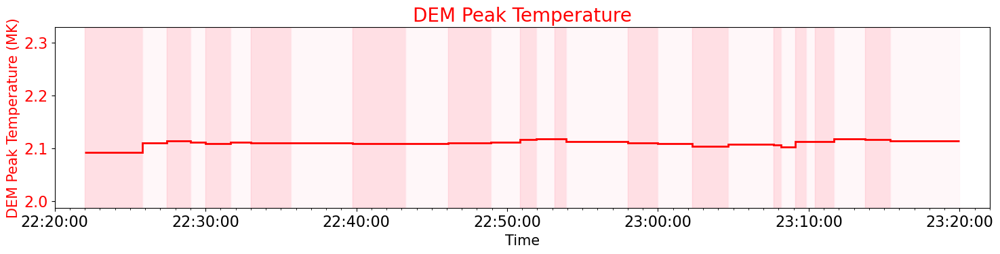

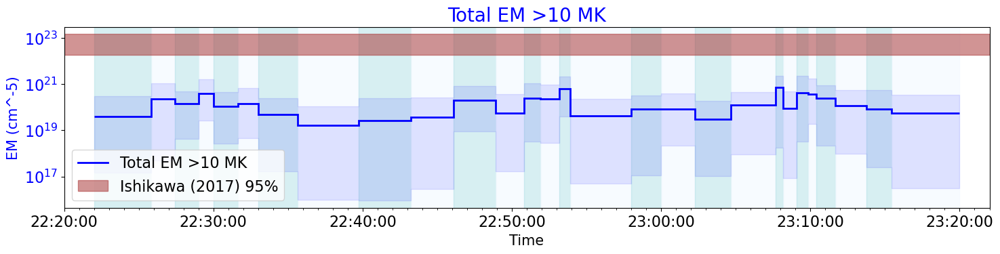

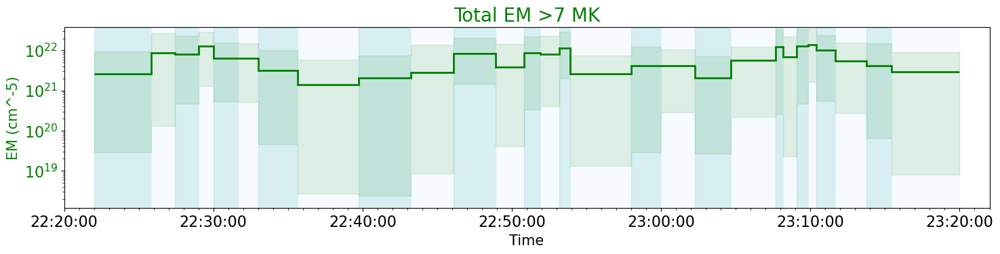

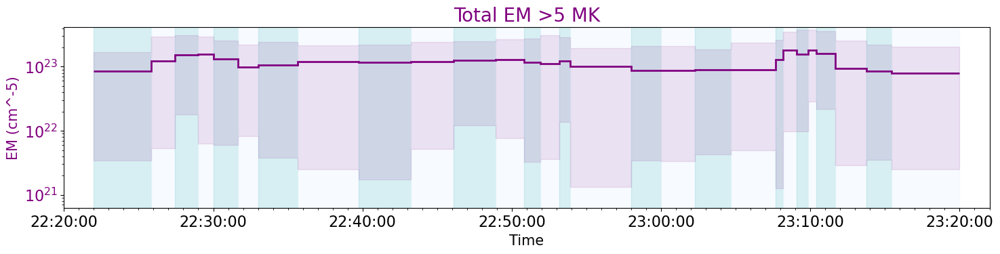

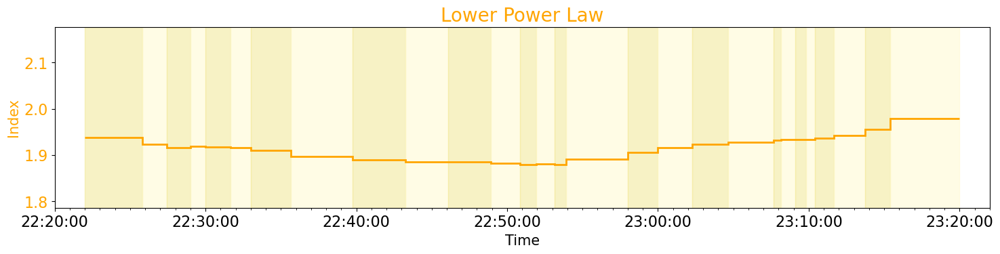

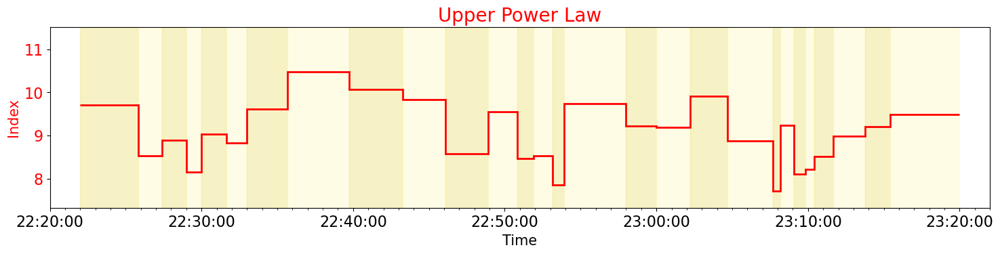

In [93]:
importlib.reload(viz)
vals = viz.get_DEM_timeseries(time_intervals, working_dir, minT, maxT, name)    


peaks=vals['peaks']
peaksmk = [10**m1/1e6 for m1 in peaks]    

backcolors=['pink', 'lavenderblush']
color='Red'
    
viz.pretty_orbit_timeseries(time_intervals, peaksmk, 'DEM Peak Temperature (MK)', 'DEM Peak Temperature',
                        color, backcolors)


backcolors=['powderblue', 'aliceblue']
color='Blue'

above10s=np.array(vals['above10s'])
above10s_=above10s[:,0]

viz.pretty_orbit_timeseries(time_intervals, above10s_, 'EM (cm^-5)', 'Total EM >10 MK',
                        color, backcolors, error=True, quantity_low=above10s[:,1], quantity_high=above10s[:,2], 
                        ylog=True, comparisonbar=True, comp_band=[1.8e22, 1.5e23, 'Ishikawa (2017) 95%'])

backcolors=['powderblue', 'aliceblue']
color='Green'

above7s=np.array(vals['above7s'])
above7s_=above7s[:,0]

viz.pretty_orbit_timeseries(time_intervals, above7s_, 'EM (cm^-5)', 'Total EM >7 MK',
                        color, backcolors, error=True, quantity_low=above7s[:,1], quantity_high=above7s[:,2], 
                        ylog=True)

backcolors=['powderblue', 'aliceblue']
color='Purple'

above5s=np.array(vals['above5s'])
above5s_=above5s[:,0]

viz.pretty_orbit_timeseries(time_intervals, above5s_, 'EM (cm^-5)', 'Total EM >5 MK',
                        color, backcolors, error=True, quantity_low=above5s[:,1], quantity_high=above5s[:,2], 
                        ylog=True)


backcolors=['khaki', 'lemonchiffon']
color='Orange'

val=np.array(vals['low_powers'])

viz.pretty_orbit_timeseries(time_intervals, val, 'Index', 'Lower Power Law',
                        color, backcolors, error=False)


backcolors=['khaki', 'lemonchiffon']
color='Red'

val=np.array(vals['hi_powers'])*-1

viz.pretty_orbit_timeseries(time_intervals, val, 'Index', 'Upper Power Law',
                        color, backcolors, error=False)

